In [94]:
from pandas_datareader import data as web
import os
import numpy as np
import pandas as pd
import plotly.graph_objects as go
import torch
import torch.nn as nn
from torch.utils.data import TensorDataset, DataLoader
import csv
from matplotlib import pyplot as plt
import random
import plotly.colors

In [296]:
def get_data(asset_name='SPY', directory='../../../data/yahoo_data', start_date='01-01-2005', stop_date='12-20-2019'):
        
    # If the 'directory' doesn't exist, create it
    if os.path.isdir(directory) == False:
        os.mkdir(directory)

    pathname = directory + '/' + asset_name + '_' + start_date + '.csv'
    if os.path.isfile(pathname) == True:
        print('Loading from file: ', pathname)        
        df = pd.read_csv(pathname, index_col='Date')
    else:
        print('Downloading from Yahoo! - ', asset_name)
        df = web.DataReader(asset_name, data_source='yahoo', start=start_date, end=stop_date)
        df.to_csv(pathname)    

    # Copy the (date) index to a Date field and make a new index which enumerates
    # all the entries.
    df.insert(0, 'Date', df.index)
    df.index = np.arange(df.shape[0])
    df['Date']=pd.to_datetime(df['Date'], format='%Y/%m/%d')
    
    return df 

In [297]:
# Synthetic stock generator

# We'll generate the Adj Close price as the primary (since this is the sequnce of labels we are training on)
# The relationship of the other features to the Adj Close will be as follows:
# Close = close_scale * Adj Close
# Open = previous day's Close
# Low = Open
# High = Close
# Volume = 0

# source_asset_name - name of asset to model from
# trend_list - list of tuples - (magnitude, days for a full cycle of this trend)

def make_synthetic_stock(source_asset_name='SPY', new_name='SYN', directory='../../../data/yahoo_data', start_date='01-01-2005', stop_date='12-20-2019', trend_list=[], adj_close_start=0, price_slope=0, close_scale=1.4):
    
    syn_df = get_data(asset_name=source_asset_name, directory=directory, start_date=start_date, stop_date=stop_date)
        
    syn_length = len(syn_df)
    
    for i in range(syn_length):
        mag = adj_close_start + (i * price_slope)
        for trend in trend_list:
            mag += (trend[0] * np.sin(6.28 * i / trend[1]))

        syn_df['Adj Close'].loc[i] = mag
        syn_df['Close'].loc[i] = mag * close_scale
    
        # Today's open is yesterday's close
        if i > 0:
            syn_df['Open'].loc[i] = syn_df['Close'].loc[i-1]
        else:
            syn_df['Open'].loc[i] = syn_df['Close'].loc[i]
        
        syn_df['Low'].loc[i] = syn_df['Open'].loc[i]
        syn_df['High'].loc[i] = syn_df['Close'].loc[i]
    
    pathname = directory + '/' + new_name + '_' + start_date + '.csv'    
    
    syn_df.to_csv(pathname, index=False)    

    

In [298]:
# Display a Plotly interactive candelstick chart

def plotly_candlestick(asset_df, asset_name):

    df = asset_df
    
    trace1 = {
        'x': df.Date,
        'open': df.Open,
        'close': df.Close,
        'high': df.High,
        'low': df.Low,
        'type': 'candlestick',
        'name': asset_name,
        'showlegend': True
    }

    data = [trace1]
        
    layout = go.Layout({
        'title': {
            'text': 'Asset: ' + asset_name,
            'font': {
                'size': 20
            }
        }
    })

    fig = go.Figure(trace1, layout)
    fig.show()



In [299]:
def add_features_to_df(df):
    # Add a feature called Prev Adj CLose
    prev_adj_close = df['Adj Close'].shift(1).copy()
    df['Prev Adj Close'] = prev_adj_close

    # Take care of special case of very first previous Adj close - just make is the same as the Adj Close
    df['Prev Adj Close'][0] = df['Prev Adj Close'][1]
    
    # Volume isn't used
    df = df.drop(columns=['Volume'])
    
    return df
    

In [300]:
# torch.cuda.is_available() checks and returns a Boolean True if a GPU is available, else it'll return False
is_cuda = torch.cuda.is_available()

print("Cuda available:",torch.cuda.is_available())

# If we have a GPU available, we'll set our device to GPU. We'll use this device variable later in our code.
if is_cuda:
    device = torch.device("cuda")
else:
    device = torch.device("cpu")

Cuda available: True


In [434]:
# This will normalise each column of a dataframe to +/- 0.5

def normalise_df(df):
           
    r = df.copy()
    
    # Get the min and max of all values in dataframe except 'Date' field
    min_value = df.drop('Date',1).min().min()    
    max_value = df.drop('Date',1).max().max()

#    print(min_value)
#    print(max_value)
    
#    r['Open'] = (r['Open'] - min_value) / (max_value - min_value) - 0.5
#    r['Low'] = (r['Low'] - min_value) / (max_value - min_value) - 0.5
#    r['High'] = (r['High'] - min_value) / (max_value - min_value) - 0.5
#    r['Close'] = (r['Close'] - min_value) / (max_value - min_value) - 0.5
#    r['Adj Close'] = (r['Adj Close'] - min_value) / (max_value - min_value) - 0.5
#    r['Prev Adj Close'] = (r['Prev Adj Close'] - min_value) / (max_value - min_value) - 0.5    


    r.loc[:, r.columns != 'Date'] = (((r.loc[:, r.columns != 'Date'] - min_value) / (max_value - min_value)) - 0.5)
#    print(r.describe())
    
#    display(r)
    scale = max_value - min_value
    offset = min_value
#    To un-normalise:
    
#    original_value = ((norm_price + 0.5) * scale) + offset
#    scale = max_value - min_value
#    offset = min_value

#    print("values from df normalisation:")
#    print("Scale:", scale)
#    print("Offset:", offset)


#    display(r.head())
#    display(df.head())
    return r, scale, offset

In [418]:
def denormalise_value(norm_value, scale, offset):
    return (((norm_value + 0.5) * scale) + offset)

In [303]:
def unnormalise_df(df, scale, offset):
    
    result = df.copy()
    
    df = ((df + 0.5) * scale) + offset
    
    return(df)

In [304]:
# Given one of the asset train, valid or test dataframes, this will make a new three dimensional list which has
# dimensions (num_samples, window_size - tw, 6) which represents the effect of sliding a window of width window_size (tw)
# down the dataframe from start to end and collecting the input features into a length 6 vector.  This will be our
# input dataset to the LSTM.

# In addition, also generate a list of (training) labels which is "tomorrow's" adjusted closing price - the thing 
# we are trying to predict. There is a single training label for each tw x 6 set of inputs.


def create_input_sequences_from_df(input_data_df, tw):
    in_seq = []
    out_seq= []
    L = len(input_data_df)

    for i in range(L-tw):
        seq = []
        for j in range(tw):
            features = [input_data_df['Open'].loc[i+j], input_data_df['Low'].loc[i+j], input_data_df['High'].loc[i+j], 
                        input_data_df['Close'].loc[i+j], 
                         input_data_df['Prev Adj Close'].loc[i+j], input_data_df['Adj Close'].loc[i+j]]
            seq.append(features)

        train_label = input_data_df['Adj Close'].loc[i+tw]
        out_seq.append(train_label)
        in_seq.append(seq)
    return in_seq, out_seq


In [305]:

def create_input_sequences_from_df(input_data_df, tw):
    in_seq = []
    out_seq= []
    L = len(input_data_df)

    for i in range(L-tw):
        window_input_seq = []
        window_output_seq = []
        for j in range(tw):
            features = [input_data_df['Open'].loc[i+j], input_data_df['Low'].loc[i+j], input_data_df['High'].loc[i+j], 
                        input_data_df['Close'].loc[i+j], 
                         input_data_df['Prev Adj Close'].loc[i+j], input_data_df['Adj Close'].loc[i+j]]
            window_input_seq.append(features)
            
            window_output_seq.append(input_data_df['Adj Close'].loc[i+j+1])

        out_seq.append(window_output_seq)
        in_seq.append(window_input_seq)
        
#        print("seq:", i)
#        print("input:\n",window_input_seq)
#        print("output:\n", window_output_seq)
    return in_seq, out_seq


In [306]:
def get_continuous_color(colorscale, intermed):
    """
    Plotly continuous colorscales assign colors to the range [0, 1]. This function computes the intermediate
    color for any value in that range.

    Plotly doesn't make the colorscales directly accessible in a common format.
    Some are ready to use:
    
        colorscale = plotly.colors.PLOTLY_SCALES["Greens"]

    Others are just swatches that need to be constructed into a colorscale:

        viridis_colors, scale = plotly.colors.convert_colors_to_same_type(plotly.colors.sequential.Viridis)
        colorscale = plotly.colors.make_colorscale(viridis_colors, scale=scale)

    :param colorscale: A plotly continuous colorscale defined with RGB string colors.
    :param intermed: value in the range [0, 1]
    :return: color in rgb string format
    :rtype: str
    """
    if len(colorscale) < 1:
        raise ValueError("colorscale must have at least one color")

    if intermed <= 0 or len(colorscale) == 1:
        return colorscale[0][1]
    if intermed >= 1:
        return colorscale[-1][1]

    for cutoff, color in colorscale:
        if intermed >= cutoff:
            low_cutoff, low_color = cutoff, color
        else:
            high_cutoff, high_color = cutoff, color
            break

    # noinspection PyUnboundLocalVariable
    return plotly.colors.find_intermediate_color(
        lowcolor=low_color, highcolor=high_color,
        intermed=((intermed - low_cutoff) / (high_cutoff - low_cutoff)),
        colortype="rgb")

In [307]:
def plotly_gradients(model, min_grads, max_grads, ave_grads):
    
    scale = plotly.colors.PLOTLY_SCALES["Bluered"]

    print("Number of gradients randomly sampled:", len(ave_grads))  
    
    
    # Assemble the names of the layers
    layers = []
    for n,p in model.named_parameters():
        if (p.requires_grad) and ("bias" not in n):
            layers.append(n)
    
    print(len(layers))
    print(len(min_grads))
    print(len(max_grads))
    print(len(ave_grads))    
    
    fig = go.Figure()
    df = pd.DataFrame(
        {'mean': [0.1,0.4,0.5,0.6,0.7,0.8,0.9],
        'max': [0.3,0.5,0.6,0.9,1.1,1.3,1.6],
        'min': [0.0,0.2,0.4,0.3,0.5,0.2,0.3],
#        {'mean': ave_grads,
#        'max': max_grads,
#        'min': min_grads,         
        'labels': layers})

    fig.add_trace(go.Scatter(x=df['labels'], y=df['min'],
        fill=None,
        mode='lines',
        line_color=get_continuous_color(scale, 0),
        name="Min",
        line={'width': 4},
        legendgroup="group1"
        ))
    fig.add_trace(go.Scatter(
        x=df['labels'],
        y=df['mean'],
        legendgroup="group2",
        fill='tonexty',
        fillcolor=get_continuous_color(scale, 0.25).replace('rgb','rgba').replace(')',',0.5)'),
        line_color=get_continuous_color(scale, 0.25),
        mode='lines', name="Bottom Half"))
    fig.add_trace(go.Scatter(x=df['labels'], y=df['mean'],
        fill=None,
        mode='lines',
        legendgroup="group1",
        line={'width': 4},
        line_color=get_continuous_color(scale, 0.5),
        name="Mean"))
    fig.add_trace(go.Scatter(
        x=df['labels'],
        y=df['max'],
        legendgroup="group2",
        fill='tonexty',
        fillcolor=get_continuous_color(scale, 0.75).replace('rgb','rgba').replace(')',',0.5)'),
        line_color=get_continuous_color(scale, 0.75),
        mode='lines',
        name="Top Half"))
    fig.add_trace(go.Scatter(x=df['labels'], y=df['max'],
        fill=None,
        mode='lines',
        legendgroup="group1",
        line={'width': 4},
        line_color=get_continuous_color(scale, 1),
        name="Max"
        ))

    fig.show()

In [308]:
# train_loss and val_loss are lists containing the loss per step

def plot_losses(train_loss, val_loss, title='Train / Validation Loss'):

    iter = len(train_loss)
    
    # Plot the training / validation loss vs step
    trace1 = {
        'x': np.arange(0,len(train_loss)),
        'y': np.array(train_loss),
                  
        'type': 'scatter',
        'name': 'Training',
        'showlegend': True
    }

    trace2 = {
        'x': np.arange(0,len(val_loss)),
        'y': np.array(val_loss),
                  
        'type': 'scatter',
        'name': 'Validation',
        'showlegend': True
    }

    data = [trace1, trace2]
        
    layout = go.Layout({
        'title': {
            'text': title,
            'font': {
                'size': 20
            }
        }
    })

    fig = go.Figure(data, layout)
    fig.show()


In [309]:
def plot_returns_hist(predicted_returns, actual_returns, title='Histogram: Predicted vs Actual Returns'):

    fig = go.Figure()
    fig.add_trace(go.Histogram(x=predicted_returns, name='Predicted'))
    fig.add_trace(go.Histogram(x=actual_returns, name='Actual'))
    fig.update_layout(
        title_text = title,
        xaxis_title_text = 'Return',
        yaxis_title_text = 'Count'
    )
    fig.show()

In [310]:
def plot_hidden(h):
    
    # h is a tuple containing 2 tensors (one for h, one for c). 
    # Each tensor is of dimension [num layers, batch size, hidden size]
    # e.g. [3, 1, 128]
        
    titles = ['Hidden State', 'Cell State']
    
    x = np.arange(0, h[0].size()[2])
        
    # Loop through hidden and cell states
    for state in range(2):
        data = []
        # Loop through each layer, add a trace for each
        for layer in range(h[state].size()[0]):
            h_tensor = h[state][layer][0].cpu()
            trace = {
                'x': x,                
                'y': np.array(h_tensor.detach().numpy()),
                  
                'type': 'scatter',
                'name': 'Layer '+str(layer),
                'showlegend': True
                }
            data.append(trace)
        
        layout = go.Layout({
            'title': {
                'text': titles[state],
                'font': {
                    'size': 20
                }
            }
        })

        fig = go.Figure(data, layout)
        fig.show()


In [311]:
def plot_lstm_output(lstm_output):
    
    # lstm_output is a tuple containing [sequence length] number of tensors.
    # Each tensor is the lstm output with dimensions [batch size, hidden size]
    # e.g. [1, 128]
    
    x = np.arange(0, lstm_output.size()[1])
        
    data = []
    
    # Loop through each layer, add a trace for each
    for i in range(len(lstm_output)):
        lstm_tensor = lstm_output[i].cpu()
        trace = {
            'x': x,
            'y': np.array(lstm_tensor.detach().numpy()),
                  
            'type': 'scatter',
            'name': 'Cell '+str(i),
            'showlegend': True
            }
        data.append(trace)
        
    layout = go.Layout({
        'title': {
            'text': 'LSTM Output',
            'font': {
                'size': 20
            }
        }
    })

    fig = go.Figure(data, layout)
    fig.show()        

In [312]:
def plot_weights(model):
    
    # Plot the linear weights - just a simple line chart
    linear_tensor = model.linear.weight[0].cpu()
    x = np.arange(0, len(model.linear.weight[0]))
    y = np.array(linear_tensor.detach().numpy())
  
    # Plot the training / validation loss vs step
    trace1 = {
        'x': x,
        'y': y,
                  
        'type': 'scatter',
        'name': 'Linear Weights',
        'showlegend': True
    }

    data = [trace1]
        
    layout = go.Layout({
        'title': {
            'text': 'Linear Weights',
            'font': {
                'size': 20
            }
        }
    })

    fig = go.Figure(data, layout)
    fig.show()
    
    ave_weights = []
    max_weights = []
    layers = []
    for n,p in model.named_parameters():
        if (p.requires_grad) and ("bias" not in n) and ("linear" not in n):
            layers.append(n)
            ave_weights.append(p.abs().mean().item())
            max_weights.append(p.abs().max().item())

    trace1 = {
        'x' : layers,
        'y' : ave_weights,
        'type' : 'bar'
    }    

    data = [trace1]
    layout = go.Layout({
        'title': {
            'text': 'Average of LSTM Weights',
            'font': {
                'size': 20
            }
        }
    })

    fig = go.Figure(data, layout)
    fig.show()
    
    trace1 = {
        'x' : layers,
        'y' : max_weights,
        'type' : 'bar'
    }    

    data = [trace1]
    layout = go.Layout({
        'title': {
            'text': 'MAX of LSTM Weights',
            'font': {
                'size': 20
            }
        }
    })

    fig = go.Figure(data, layout)
    fig.show()
    
    

In [313]:
def gradient_plot(layer_names, grads, color, title):
       
    for i in range(len(grads)):
        plt.plot(grads[i], alpha=0.3, color=color)
    
    plt.hlines(0, 0, len(grads)+1, linewidth=1, color="k")
    plt.xticks(range(0,len(grads[0]),1), layer_names, rotation="vertical")
    plt.xlim(xmin=0, xmax=len(grads[0]))
    
    plt.xlabel("Layers")
    plt.ylabel("Gradient")
    plt.title(title)
    plt.grid(True)
    plt.show()



In [314]:
def plot_gradients(model, ave_grads, max_grads):

    print("Number of gradients randomly sampled:", len(ave_grads))    
    
    # Assemble the names of the layers
    layers = []
    for n,p in model.named_parameters():
        if (p.requires_grad) and ("bias" not in n):
            layers.append(n)

    gradient_plot(layers, ave_grads, 'b', 'Gradient Flow - All Layers - Average')
    gradient_plot(layers, max_grads, 'r', 'Gradient Flow - All Layers - Max')
        
    ave_grads_lstm = [sublist[:len(layers)-1] for sublist in ave_grads]
    max_grads_lstm = [sublist[:len(layers)-1] for sublist in max_grads]
    layers_lstm = layers[0:len(layers)-1]
    
    gradient_plot(layers_lstm, ave_grads_lstm, 'b', 'Gradient Flow - LSTM Layers - Average')
    gradient_plot(layers_lstm, max_grads_lstm, 'r', 'Gradient Flow - LSTM Layers - Max')
 


In [315]:

class NeilLSTM(nn.Module):
    def __init__(self, input_size = 6, window_size = 11, arch = 'LH', hidden_size = 64, output_size = 1, num_layers = 3, dropout=0.5):
        super().__init__()
        
        # Store some stuff we need to know in the forward pass
        self.n_layers = num_layers        
        self.hidden_layer_size = hidden_size
        self.arch = arch

        # Define the LSTM layer
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, 
                            batch_first=False, bias=True, dropout=dropout, bidirectional=False)
                
        # Define the linear layer
        # Perhaps should perform forward on the lstm to explicitly get the size of the 
        # tensor for sequence to one vs sequence to sequence versions.
        
        # The size of the linear layer for LH or AH model
        if arch == 'LH':
            self.linear = nn.Linear(hidden_size, output_size, bias = True)
        elif arch == 'AH':
            self.linear = nn.Linear(hidden_size * window_size, output_size, bias = True)
        
        torch.nn.init.xavier_uniform_(self.linear.weight)
        
        # NEED TO FIX THIS STUPID HARD CODED INIT
        if num_layers >= 1:
            torch.nn.init.xavier_uniform_(self.lstm.weight_hh_l0)
            torch.nn.init.xavier_uniform_(self.lstm.weight_ih_l0)
            
        if num_layers >= 2:
            torch.nn.init.xavier_uniform_(self.lstm.weight_hh_l1)        
            torch.nn.init.xavier_uniform_(self.lstm.weight_ih_l1)                    
        
        if num_layers >= 3:
            torch.nn.init.xavier_uniform_(self.lstm.weight_hh_l2)                        
            torch.nn.init.xavier_uniform_(self.lstm.weight_ih_l2)                        
        
        
    # Forward pass
    # input_seq shape is: (sequence length, num input features) - there's no batch dimension
    def forward(self, input_seq, hidden, verbose=0, plot=0):

        if verbose:
            print("\n\nlstm input:\n", input_seq)
            print("\n\nlstm input view:\n", input_seq.view( len(input_seq) , 1 , -1))
            print("\n\nlstm hidden input:\n", hidden)
            
        lstm_out, hidden = self.lstm( input_seq.view( len(input_seq) , 1 , -1), hidden)
        
        if verbose:
            print("\n\nlstm_output:\n", lstm_out)
            print("\n\nhidden output:\n", hidden)
                    
        # Feed forward the outputs of the lstm into the linear layer       
        # lstm_out dims are (seq_len, batch, hidden dim)
        # This is converted to (seq_len, hidden_dim) before input to the linear layer        
        # When T=22 and hidden_layer_size=64, the shape of the lstm_out tensor is [22,1,64]    
        # This view reshapes it to [22, 64]
        lstm_out_view = lstm_out.view(len(input_seq), -1)
        
        if verbose:
            print("\n\nlstm_out_view:\n", lstm_out_view)
                                       
        if verbose:
            print("\n\nLinear weights:\n", self.linear.weight)
            print("\n\ninput to fc:\n", lstm_out_view[-1])
        
        # LH - Just present the last hidden state to the linear network            
        if self.arch == 'LH':
            predictions = self.linear(lstm_out_view[-1])
        # AH - flatten and present all to linear network
        elif self.arch == 'AH':
            predictions = self.linear(torch.flatten(lstm_out_view))
        
        if verbose:
            print("\n\npredictions:\n",predictions)
        
        # predictions has dimension: (1, seq_len)        
        return predictions, hidden, lstm_out_view
    
    
    def init_hidden(self, batch_size = 1):
        weight = next(self.parameters()).data
        hidden = (weight.new(self.n_layers, batch_size, self.hidden_layer_size).zero_().to(device),
                 weight.new(self.n_layers, batch_size, self.hidden_layer_size).zero_().to(device))
        return(hidden)
        

In [424]:
# Trains the given LSTM model. Also collects validation data (predicting the next day) and collects stats
# for both.  These are used to observe training vs validation but also to construct the first allocation policy.

def train_model(model, train_seq, train_labels, scale=1, offset=1, train_start=0, train_length=1, epochs = 20, iter_per_seq=1, max_iter=1600, lr = 0.001, dr=0.999, verbosity=0, plot=0):
    input_size = 6
    
    print("Scale:", scale)
    print("Offset:", offset)
    
    loss_function = nn.MSELoss()

    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    my_lr_scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer = optimizer, gamma = dr)
    
    batch_size = 1  # batch mode isn't used actually but including for future possible use
               
    if verbosity == 1:
        print('Epc\tTrLoss\t\tValLoss\t\tVAdjC\tVPred\tVAct\tVPredRt\tVActRt\tMDA\tMAPE\tMAE\tMSE')                                
    if verbosity == 2:
        print('Iter\tTrLoss\t\tTAdjC\tTPred\tTAct\tPredRt\tActRt\tValLoss\t\tVAdjC\tVPred\tVAct\tVPredRt\tVActRt')            
                            
    result_list = []
    
    train_losses = []
    val_losses = []
    val_adj_close_price = []
    ave_grads = []
    max_grads = []
    min_grads = []
    
    if (epochs * train_length) > 1000:
        sample_grads = 1000.0 / (epochs * train_length)
    else:
        sample_grads = 1.0
            
    iteration = 0
    # How many times through the entire training set
    for i in range(epochs):
        val_pred_rt = []
        val_act_rt = []
        val_pred_price = []
        val_act_price = []        
        # Each sample in the training set
        for j in range(train_start, train_start + train_length):      

            # Send input / label data to Cuda if available
            inputs = train_seq[j].to(device)
            labels = train_labels[j].to(device)
        
            model.train()
        
            # How many times we train on each sample as we go
            for iter in range(iter_per_seq):
            
                # Initialise hidden states before every training event
                h = model.init_hidden(batch_size)  
                                    
                optimizer.zero_grad()
        
                y_pred, h, lstm_out = model(inputs, h)

                # y_pred and labels are both size T - sequence to sequence loss function
                train_loss = loss_function(y_pred, labels)
            
                # Compute gradients and update the model
                train_loss.backward()
                                
                optimizer.step()
                my_lr_scheduler.step()

            # Sample stochastically the last set of gradients for plotting later
            if plot and (random.random() < sample_grads):
                ave_grad=[]
                max_grad=[]
                min_grad=[]
                for n,p in model.named_parameters():
                    if (p.requires_grad) and ("bias" not in n):
                        ave_grad.append(p.grad.abs().mean())
                        max_grad.append(p.grad.abs().max())
                        min_grad.append(p.grad.abs().min())
                ave_grads.append(ave_grad)
                max_grads.append(max_grad)
                min_grads.append(min_grad)
            
            # Compute metrics for the training set
            training_loss = train_loss.item()
            train_adj_close = inputs[-1][-1].item()
            train_pred = y_pred[-1].item()
            train_truth = labels[-1].item()
            train_predicted_return = (denormalise_value(train_pred, scale, offset) / denormalise_value(train_adj_close, scale, offset)) - 1            
            train_actual_return = (denormalise_value(train_truth, scale, offset) / denormalise_value(train_adj_close, scale, offset)) - 1

            # Compute metrics for the validation - validation is how well the network predicts the next sequence
            model.eval()
            
            inputs = train_seq[j+1].to(device)
            labels = train_labels[j+1].to(device)
            
            with torch.no_grad():
                h = model.init_hidden(batch_size)
        
                # If we are in the last forward pass of the last epoch, plot the model params etc
                if plot >= 1 and j == (train_start + train_length - 1) and i == epochs - 1:
                    y_pred, h, lstm_out = model(inputs, h, plot=1)
                else:
                    y_pred, h, lstm_out = model(inputs, h, plot=0)
                    
                valid_adj_close = inputs[-1][-1].item()                
                valid_pred = y_pred[-1].item()
                valid_truth = labels[-1].item()
                valid_loss = (valid_pred - valid_truth)**2                
            
                valid_predicted_return = (denormalise_value(valid_pred, scale, offset) / denormalise_value(valid_adj_close, scale, offset)) - 1
                valid_actual_return = (denormalise_value(valid_truth, scale, offset) / denormalise_value(valid_adj_close, scale, offset)) - 1
            

                result_list.append([i,j,iteration, training_loss, train_adj_close, train_pred, train_truth, 
                              train_predicted_return, train_actual_return, valid_loss, valid_adj_close, 
                              valid_pred, valid_truth, valid_predicted_return, valid_actual_return])
                
                if (verbosity==2) and (i==epochs-1):
                    print('{:3}'.format(iteration), '\t{:1.2e}'.format(training_loss),
                         '\t{:2.6f}'.format(train_adj_close), 
                         '\t{:2.6f}'.format(train_pred), '\t{:2.6f}'.format(train_truth),
                          '\t{:2.3f}'.format(train_predicted_return), '\t{:2.3f}'.format(train_actual_return),
                          '\t{:1.2e}'.format(valid_loss), '\t{:1.6f}'.format(valid_adj_close), 
                          '\t{:1.6f}'.format(valid_pred), '\t{:1.6f}'.format(valid_truth),
                          '\t{:2.3f}'.format(valid_predicted_return), '\t{:2.3f}'.format(valid_actual_return))
                    
                train_losses.append(training_loss)
                val_losses.append(valid_loss)
                val_pred_rt.append(valid_predicted_return)
                val_act_rt.append(valid_actual_return)
                val_pred_price.append(valid_pred)
                val_act_price.append(valid_truth)
                val_adj_close_price.append(valid_adj_close)
                        
            if iteration >= max_iter:
                break
            else:
                iteration = iteration + 1
                    
        # Output summary stats at end of epoch
        if verbosity==1:            
            metrics_dict = compute_metrics(np.array(val_pred_rt),
                                   np.array(val_act_rt),
                                   np.array(val_pred_price),
                                   np.array(val_act_price))
            
            print('{:3}'.format(i), '\t{:4.5e}'.format(training_loss),
                          '\t{:4.5e}'.format(valid_loss), 
                          '\t{:2.2f}'.format(valid_adj_close), 
                          '\t{:2.2f}'.format(valid_pred), 
                          '\t{:2.2f}'.format(valid_truth),
                          '\t{:2.3f}'.format(valid_predicted_return), 
                          '\t{:2.3f}'.format(valid_actual_return),
                          '\t{:2.2f}'.format(metrics_dict['MDA']), 
                          '\t{:2.2f}'.format(metrics_dict['MAPE']), 
                          '\t{:2.2f}'.format(metrics_dict['MAE']),
                          '\t{:2.3f}'.format(metrics_dict['MSE']))           
        
        if iteration > max_iter:
            break
        
        
    result_dict = {'val_pred_rt':val_pred_rt, 'val_act_rt':val_act_rt, 'val_pred_price':val_pred_price,
                  'val_act_price':val_act_price, 'val_adj_close_price': val_adj_close_price}
    
    
    
    if plot:
        print("\n\nSnapshot of model at end of training:")
        print("*************************************")
        plot_gradients(model, ave_grads, max_grads)
        plotly_gradients(model, min_grads, max_grads, ave_grads)
        plot_hidden(h)
        plot_lstm_output(lstm_out)
        plot_weights(model)
        plot_losses(train_losses, val_losses, title='Model Training: Training Loss vs Validation Loss')
        plot_returns_hist(val_pred_rt, val_act_rt, title='Model Training: Predicted vs Actual Returns')
            
    return model, result_list, result_dict



In [425]:
# This creates a model instance and trains it on the training set

def create_train_model(df, scale=1, offset=1, arch='LH', window_size = 22, epochs=20, iter_per_seq=1, max_iter=1600, num_layers=2, hidden_size=64, dropout=0.5, lr=0.001, dr=1, verbosity=0, plot=0):

    # Generate training set
#    df = train_asset_dict[asset]

    train_seq, train_labels = create_input_sequences_from_df(df, window_size)

    # Convert our list of lists to Tensors
    train_seq = torch.FloatTensor(train_seq)
    train_labels = torch.FloatTensor(train_labels)
       
    if verbosity>=1:
        print("Building LSTM Model with the following parameters:")
        print("Architecture:", arch)
        print("Num layers:", num_layers)
        print("Hidden size:", hidden_size)
        print("Dropout:", dropout)
        print("Learning Rate:", lr)
        print("LR Decay Rate:", dr)
        print("Start training...")
    
    model = NeilLSTM(input_size=6, window_size=window_size, arch=arch, hidden_size=hidden_size, output_size=window_size, num_layers=num_layers, dropout=dropout)
    model.to(device)

    # Stop one short of the end as we use the t+1 for validation during training
    model, result_list, result_dict = train_model(model, train_seq, train_labels, scale=scale, offset=offset, train_start=0, train_length=len(train_seq)-1, epochs=epochs, iter_per_seq=iter_per_seq, max_iter=max_iter, lr=lr, dr=dr, verbosity=verbosity, plot=plot)
    
    # Dump the results to log file
    with open("ch7_train_log.csv", 'w', newline='') as myfile:
        wr = csv.writer(myfile, quoting=csv.QUOTE_ALL)
        for i in range(len(result_list)):
            wr.writerow(result_list[i])
    
    return model, result_dict

In [426]:
# Compute the interim metrics per the paper table 8 - MDA, MAPE, MAE, MSE

# Pass in lists of next day predicted and actual returns, predicted and actual prices
def compute_metrics(pred_rt, act_rt, pred_price, act_price):

    len_data = len(pred_rt)

    product = pred_rt * act_rt
    MDA = 100 * len(np.where(product > 0)[0]) / len_data
    MAPE = 100 * sum(abs(act_price - pred_price) / act_price) / len_data
    MAE = sum(abs(act_price - pred_price)) / len_data
    MSE = sum((act_price - pred_price) ** 2) / len_data
    
    metrics_dict = {'N':len_data, 'MDA':MDA, 'MAPE': MAPE, 'MAE': MAE, 'MSE':MSE}
    
    return metrics_dict

In [427]:
# Call this routine whenever a new predicted return is generated (each new day)

# inputs:
# D - a list of all the predicted returns, by trading day, to date
# Q - a list of the bin cut-offs
# new_pred_return - the new predicted return from the model
# percentiles - a list of percentiles used to determine the bins (e.g. [0,10,20,30,40,50,60])

# returns:
# D - Updated
# Q - updated

def update_DQ(D, Q, new_pred_return, percentiles):

    # Append the new predicted return to the existing list
    D = np.append(D,new_pred_return)
    
    # If the predicted return is negative, it won't affect the binning calculation
    if new_pred_return <= 0:
        return D, Q
    
    # Percentile the positive returns
    returns = np.array(D)
    Q = np.percentile(returns[returns >= 0], percentiles)
    
    # Q now contains the cutoff values for each bin.  Each bin will contain approximately 10% of the positive
    # returns except the last one which is an amalgamation of 4 bins so it will contain approx 40%
        
    # return updated D and Q
    return D, Q

In [428]:
# Call this routine whenever a new sell is executed (and therefore we have a new expected value for a bin)

def update_EA(E, A, profit, purchase_bin):

    # Append the new profit amount to the correct bin in E        
    E[purchase_bin] = E[purchase_bin] + profit
    
    # Update A - bins with positive total profits are set to 1 (a buy signal)
    # bins with negative profits are set to 0 - a do nothing signal
    # bin 0 is the unique, sell signal
    A = (E > 0).astype(int)    
    
    return E, A

    

In [461]:
# This function combines model training (updates), predicting next day return, trading and updating the trading
# policy each day.
# Much of the code is a repeat / combo of the above two seperate routines of training the model and 
# genertaing the policy. This is different as we are now "live" and updating the model / policy only on
# previously unseen data.
# Also, although the model is using Adj Close as the label for training, what we need to record for evaluation
# is the Open price for purchases and sales (assuming we are running the model overnight between two trade
# days).The model updates and issues trades which will be filled at the next trading day open.


def test_trading_system(model, test_seq, test_labels, D, Q, E, A, percentiles, scale=1, offset=1, iter_per_seq=1, lr = 0.001, dr = 1, verbosity=0):
    input_size = 6
        
    loss_function = nn.MSELoss()

    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    my_lr_scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer = optimizer, gamma = dr)
    
    batch_size = 1  # batch mode isn't used actually but including for future possible use
            
    holding = False;
    journal = []   
    total_profit_open = 0
    total_profit_adj_close = 0
    C = np.zeros(shape=(len(E)))
    
    # Keep list of predicted and actual returns and prices (for metrics reporting)
    test_pred_rt = []
    test_act_rt = []
    test_pred_price = []
    test_act_price = []    
    
    for j in range(0, len(test_seq) - 2):      

        # Send input / label data to Cuda if available
        inputs = test_seq[j].to(device)
        labels = test_labels[j].to(device)
        
        model.train()
        
        # How many times we train on each sample as we go
        for iter in range(iter_per_seq):

            # Initialise hidden states before every epoch
            h = model.init_hidden(batch_size)  
                                    
            optimizer.zero_grad()
        
            y_pred, h, lstm_out = model(inputs, h, verbose=0)
               
    #        test_loss = loss_function(y_pred[-1], labels)
            test_loss = loss_function(y_pred, labels)
               
            # Compute gradients and update the model
            test_loss.backward()
            optimizer.step()
            my_lr_scheduler.step()
                       
        # Having updated the model with "todays" inputs, we now predict "tomorrows" return
        model.eval()
            
        inputs = test_seq[j+1].to(device)
        labels = test_labels[j+1].to(device)
            
        with torch.no_grad():
            h = model.init_hidden(batch_size)
        
            y_pred, h, lstm_out = model(inputs, h)
            test_adj_close = inputs[-1][-1].item()                
            test_pred = y_pred[-1].item()
                        
            test_predicted_return = (denormalise_value(test_pred, scale, offset) / denormalise_value(test_adj_close, scale, offset)) - 1
            test_truth = labels[-1].item()

            test_pred_price.append(test_pred)
            test_act_price.append(test_truth)
            test_pred_rt.append(test_predicted_return)
            test_act_rt.append((denormalise_value(test_truth, scale, offset) / denormalise_value(test_adj_close, scale, offset)) - 1)
            
        if verbosity >= 3:
            print(j, '{:1.2f}'.format(test_adj_close), '{:1.4f}'.format(test_predicted_return))
            
            
        # Sell
        if test_predicted_return < 0 and holding:
            open_sell_price = denormalise_value(test_seq[j+2][-1][0].item(), scale, offset) # Next day open
            sell_price = denormalise_value(test_adj_close, scale, offset)
            profit = sell_price - purchase_price
            E, A = update_EA(E, A, profit, purchase_bin)
            if verbosity >= 3:
                print("E", E)
                print("A", A)
            holding = False
            
            total_profit_open = total_profit_open + (open_sell_price - open_purchase_price)
            total_profit_adj_close = total_profit_adj_close + profit
            journal.append((-1, j+2+len(inputs), sell_price, total_profit_adj_close, open_sell_price, total_profit_open))
            if verbosity >= 2:
                print("Executed sell at ${:1.2f}".format(sell_price), "on day", j, "Profit: ${:1.4f}".format(profit))

        # Buy
        if test_predicted_return >= 0 and not holding:
            return_bin = np.digitize(test_predicted_return, Q)
            if verbosity >= 3:
                print("Q",Q,"return_bin", return_bin)
            if A[return_bin] > 0:
                purchase_bin = return_bin
                C[purchase_bin] = C[purchase_bin] + 1
                open_purchase_price = denormalise_value(test_seq[j+2][-1][0].item(), scale, offset) # Next day open
                purchase_price = denormalise_value(test_adj_close, scale, offset)
                holding = True
                journal.append((1, j+2+len(inputs), purchase_price, total_profit_adj_close, open_purchase_price, total_profit_open))
                if verbosity >= 2:
                    print("Executed buy at ${:1.2f}".format(purchase_price), "on day ", j, "bin", return_bin)

        D, Q = update_DQ(D, Q, test_predicted_return, percentiles)

    # Item 0 is the Open price
    start_price = denormalise_value(test_seq[0][-1][0].item(), scale, offset)

    # Item 3 is the Close price
    end_price = denormalise_value(test_seq[-1][-1][3].item(), scale, offset)

    if len(journal):
        test_profit = journal[-1][-1]
        test_return_pct = 100 * journal[-1][-1]/start_price
    else:
        test_profit = 0
        test_return_pct = 0
    
    if verbosity >= 1:

        print("Buy and Hold Baseline:")
        print("Price at start: ${:1.2f}".format(start_price))
        print("Price at end: ${:1.2f}".format(end_price))
        print("Difference: ${:1.2f}".format(end_price - start_price))
        print("Return:{:1.2f}%".format(100*(end_price - start_price)/start_price))

        print("\nProfit from trading:{:1.2f}".format(test_profit))
        print("Return from trading:{:1.2f}%".format(test_return_pct))
    
        print("Length Returns:", len(D))
        print("Q:\n", Q)
        print("E:\n", E)
        print("A:\n", A)
        print("C:\n", C)
        
    metrics_dict = compute_metrics(np.array(test_pred_rt),
                                   np.array(test_act_rt),
                                   np.array(test_pred_price),
                                   np.array(test_act_price))

    if verbosity >= 1:
        print("N:", metrics_dict['N'], "\tMDA:{:1.2f}".format(metrics_dict['MDA']), "\tMAPE:{:1.2f}".format(metrics_dict['MAPE']), 
              "\tMAE:{:1.2f}".format(metrics_dict['MAE']), "\tMSE:{:1.2f}".format(metrics_dict['MSE']))        
        
    result_dict = {'bnh_profit': end_price - start_price, 'bnh_Return':100*(end_price - start_price)/start_price,
              'trade_profit':test_profit, 'trade_return': test_return_pct, 'pred_rt':test_pred_rt, 
                  'act_rt':test_act_rt, 'pred_price':test_pred_price, 'act_price':test_act_price}
    
    result_dict.update(metrics_dict)

            
    # return updated model, updated D, Q E and A, journal and results from this test period
    return model, D, Q, E, A, journal, result_dict

In [462]:
def run_hypers(window_size=11, asset='SPY', train_epochs=10, iter_per_seq=1, arch='LH', num_layers=3, hidden_size=128, dropout=0.5, lr=0.01, dr=1, verbosity=0, plot=0):
    
    # Go get the data
    abs_df = get_data(asset_name=asset, directory='../../../data/yahoo_data', start_date='01-01-2005', stop_date='12-20-2019')
    
    plotly_candlestick(abs_df, asset)
    
    # Add the Prev Adj Close, drop volume etc
    abs_df = add_features_to_df(abs_df)
    
    df, scale, offset = normalise_df(abs_df)
    
    plotly_candlestick(df, asset)    
                
    # Training set
    train_start = '01-01-2005'
    train_end = '01-01-2008'

    # Validation set
    valid_start = '01-02-2008'
    valid_end = '12-31-2009'    
    
    # Out of sample test set
    test_start = '01-01-2010'
    test_end = '12-20-2019'
    
    train_asset_dict = {}
    valid_asset_dict = {}
    test_asset_dict = {}    
    
    # Mask off the training data and assign result to a train_asset dictionary
    mask = (df['Date'] >= train_start) & (df['Date'] <= train_end)
    train_asset_df = df.loc[mask]
    
    # Mask off the validation data and assign result to a valid_asset dictionary
    mask = (df['Date'] >= valid_start) & (df['Date'] <= valid_end)
    valid_asset_df = df.loc[mask]
    
    # Mask off the test data and assign result to a test_asset dictionary
    mask = (df['Date'] >= test_start) & (df['Date'] <= test_end)
    test_asset_df = df.loc[mask]
        
    # Reset the indices to start from 0 again for each of the dataframes
    train_asset_df.index = np.arange(train_asset_df.shape[0])   
    valid_asset_df.index = np.arange(valid_asset_df.shape[0])    
    test_asset_df.index = np.arange(test_asset_df.shape[0]) 

#    plotly_candlestick(train_asset_df, asset)    
        
#    norm_train_asset_df, scale, offset = normalise_df(train_asset_df)
    
#    plotly_candlestick(norm_train_asset_df, asset)    
        
    percentiles = [0,10,20,30,40,50,60]
    
    # create and train the model (for 3 epochs - this is more iterations than the paper specifies (which is 1600)
    # as I want the training to end at the end of the training set to avoid dicontinuities when rolling into
    # the validation set)
    
    model, train_result_dict = create_train_model(train_asset_df, scale=scale, offset=offset, arch=arch, 
                                            window_size = window_size, epochs=train_epochs,
                                            iter_per_seq=iter_per_seq, max_iter=1E32, num_layers=num_layers,
                                            hidden_size=hidden_size, dropout=dropout, lr=lr, dr=dr, verbosity=verbosity,
                                            plot=plot)
        
    
    # These start and stop idx's mark the safe area of the training validation results (avoiding discontinuities)
    
#    for i in range ((len(train_result_dict['val_pred_rt']))):
#        print(i, train_result_dict['val_pred_price'][i], train_result_dict['val_act_price'][i], 
#              train_result_dict['val_pred_rt'][i], train_result_dict['val_act_rt'][i])
    
    stop_idx = len(train_result_dict['val_pred_rt'])
    start_idx = stop_idx - len(train_asset_df) + 100

    metrics_dict = compute_metrics(np.array(train_result_dict['val_pred_rt'])[start_idx:stop_idx],
                                   np.array(train_result_dict['val_act_rt'])[start_idx:stop_idx],
                                   np.array(train_result_dict['val_pred_price'])[start_idx:stop_idx],
                                   np.array(train_result_dict['val_act_price'])[start_idx:stop_idx])

    if verbosity >= 1:
        print("N:", metrics_dict['N'], "\tMDA:{:1.2f}".format(metrics_dict['MDA']), "\tMAPE:{:1.2f}".format(metrics_dict['MAPE']), 
              "\tMAE:{:1.2f}".format(metrics_dict['MAE']), "\tMSE:{:1.2f}".format(metrics_dict['MSE']))    
    
    
    # Point D at the training predicted returns - for the period we are interested in (last epoch, avoiding discontinuity)
    D = np.array(train_result_dict['val_pred_rt'])[start_idx:stop_idx]

    # Compute the percentiles of only the POSITIVE training returns
    Q = np.percentile(D[D >= 0], percentiles)
    
    if verbosity >= 1:
        print("Num expected returns from training:", len(D))
        print("Initial Q:\n",Q)

    # There will be 8 bins from 7 percentiles - anything below the lowest percentile is placed in bin 0
    # Anything equal to or greater than the lowest percentile but less than the 2nd wil be in bin 1 etc
    # Anything equal to or greater than the last percentile will be in the last bin.
    
    if verbosity >= 2:
        binned_returns = np.digitize(D, Q)
        unique, counts = np.unique(binned_returns, return_counts=True)
        print("Unique bins:", unique)
        print("Counts / bin:", counts)

    # Generate the Expected Returns for each bin in Q from the training data
    
    holding = False
    E = np.zeros(shape=(len(percentiles)+1))
    C = np.zeros(shape=(len(percentiles)+1))
    
    if verbosity >= 1:
        print("\nComputing initial allocation policy from the training set...")
    
    pred_rt = np.array(train_result_dict['val_pred_rt'])
    adj_close = np.array(train_result_dict['val_adj_close_price'])

    
    for i in range(start_idx, stop_idx):
    
        if verbosity >= 2:
            print(i, '{:1.2f}'.format(adj_close[i]), '{:1.4f}'.format(pred_rt[i]))
        
        # Sell
        if pred_rt[i] < 0 and holding:
            sell_price = denormalise_value(adj_close[i], scale, offset)
            profit = sell_price - purchase_price
            E[purchase_bin] = E[purchase_bin] + profit
            holding = False
            if verbosity >= 2:
                print("Executed sell at ${:1.2f}".format(sell_price), "on day", i, "Profit: ${:1.4f}".format(profit))

        # Buy
        if pred_rt[i] >= 0 and not holding:
            return_bin = np.digitize(pred_rt[i], Q)
            purchase_bin = return_bin
            C[purchase_bin] = C[purchase_bin] + 1
            purchase_price = denormalise_value(adj_close[i], scale, offset)
            holding = True
            if verbosity >= 2:
                print("Executed buy at ${:1.2f}".format(purchase_price), "on day ", i, "bin", return_bin)
   
    
    # It's important to understand that bin 0 won't have any trades at this point because we gave it the training
    # data with a certain lower positive return. This value defines the lowest cut off of the training data. However,
    # once we start getting new data we will see values probaby lower than this lowest bin cut off.
    
    A = (E > 0).astype(int)
    
    if verbosity >= 1:
        print("Expected Gains per Bin:", E)
        print("Trades per bin:", C)
        print("\nInitial Allocation Policy:",A)    
        print("\nPERFORMING VALIDATION...")
        
    # Generate validation attribute set
    valid_seq, valid_labels = create_input_sequences_from_df(valid_asset_df, window_size)


    # Convert our list of lists to Tensors
    valid_seq = torch.FloatTensor(valid_seq)
    valid_labels = torch.FloatTensor(valid_labels)

    model, D, Q, E, A, journal, test_result_dict = test_trading_system(model, valid_seq, valid_labels, D, Q, E, A, percentiles, scale=scale, offset=offset, iter_per_seq=iter_per_seq, lr = 0.001, dr = 1, verbosity=verbosity)

    result_dict = {'val_profit':test_result_dict['trade_profit'], 'val_return_pct':test_result_dict['trade_return']}
            
    if verbosity >= 1:
        print("\nEVALUATING TEST SET...")    
        
    # Generate test attribute set
    test_seq, test_labels = create_input_sequences_from_df(test_asset_df, window_size)

    # Convert our list of lists to Tensors
    test_seq = torch.FloatTensor(test_seq)
    test_labels = torch.FloatTensor(test_labels)

    model, D, Q, E, A, journal, test_result_dict = test_trading_system(model, test_seq, test_labels, D, Q, E, A, percentiles, scale=scale, offset=offset, iter_per_seq=iter_per_seq, lr = 0.001, dr = 1, verbosity=verbosity)
    
    result_dict['test_profit'] = test_result_dict['trade_profit']
    result_dict['test_return_pct'] = test_result_dict['trade_return']    
    
    return model, journal, result_dict
    


In [450]:
make_synthetic_stock(source_asset_name='SPY', new_name='SYN', directory='../../../data/yahoo_data', start_date='01-01-2005', stop_date='12-20-2019', trend_list=[(10,17)], adj_close_start=85, price_slope=0.01, close_scale=1)

Loading from file:  ../../../data/yahoo_data/SPY_01-01-2005.csv


In [ ]:
torch.set_printoptions(profile="full")
model, journal, result = run_hypers(window_size=11, asset='SPY', train_epochs=1000, iter_per_seq=1, arch='AH', num_layers=3, hidden_size=128, dropout=0.5, lr=0.0001, dr=1, verbosity=1, plot=1)

print(result)

Loading from file:  ../../../data/yahoo_data/SPY_01-01-2005.csv


C:\Users\q2\Anaconda3\envs\mlp\lib\site-packages\ipykernel_launcher.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Building LSTM Model with the following parameters:
Architecture: AH
Num layers: 3
Hidden size: 128
Dropout: 0.5
Learning Rate: 0.0001
LR Decay Rate: 1
Start training...
Scale: 268.46613693237305
Offset: 53.50386428833008
Epc	TrLoss		ValLoss		VAdjC	VPred	VAct	VPredRt	VActRt	MDA	MAPE	MAE	MSE
  0 	1.15624e-04 	2.97091e-04 	-0.28 	-0.26 	-0.28 	0.034 	-0.007 	53.37 	-4.60 	0.02 	0.002
  1 	1.99984e-04 	2.67297e-04 	-0.28 	-0.27 	-0.28 	0.031 	-0.007 	51.48 	-2.12 	0.01 	0.000
  2 	1.29976e-04 	3.14000e-04 	-0.28 	-0.26 	-0.28 	0.035 	-0.007 	53.23 	-2.10 	0.01 	0.000
  3 	2.15482e-04 	9.28493e-05 	-0.28 	-0.27 	-0.28 	0.015 	-0.007 	53.23 	-1.94 	0.01 	0.000
  4 	9.08993e-05 	1.65451e-04 	-0.28 	-0.27 	-0.28 	0.023 	-0.007 	54.18 	-1.82 	0.01 	0.000
  5 	8.83433e-05 	1.20643e-04 	-0.28 	-0.27 	-0.28 	0.019 	-0.007 	53.23 	-1.82 	0.01 	0.000
  6 	1.19521e-04 	1.06552e-04 	-0.28 	-0.27 	-0.28 	0.017 	-0.007 	53.50 	-1.84 	0.01 	0.000
  7 	8.33860e-05 	1.32417e-04 	-0.28 	-0.27 	-0.28 	0.020 

 85 	2.89800e-05 	2.65516e-07 	-0.28 	-0.28 	-0.28 	-0.006 	-0.007 	50.13 	-2.18 	0.01 	0.000
 86 	2.92056e-05 	2.36355e-06 	-0.28 	-0.28 	-0.28 	-0.004 	-0.007 	50.67 	-2.14 	0.01 	0.000
 87 	2.92784e-05 	2.20573e-06 	-0.28 	-0.28 	-0.28 	-0.004 	-0.007 	51.48 	-2.14 	0.01 	0.000
 88 	2.67006e-05 	2.65091e-06 	-0.28 	-0.28 	-0.28 	-0.004 	-0.007 	50.54 	-2.13 	0.01 	0.000
 89 	3.55302e-05 	3.10023e-07 	-0.28 	-0.28 	-0.28 	-0.006 	-0.007 	51.35 	-2.14 	0.01 	0.000
 90 	2.83217e-05 	9.01780e-07 	-0.28 	-0.28 	-0.28 	-0.005 	-0.007 	51.08 	-2.11 	0.01 	0.000
 91 	2.85604e-05 	1.94832e-06 	-0.28 	-0.28 	-0.28 	-0.004 	-0.007 	50.94 	-2.06 	0.01 	0.000
 92 	2.90582e-05 	5.61633e-06 	-0.28 	-0.28 	-0.28 	-0.002 	-0.007 	51.48 	-2.05 	0.01 	0.000
 93 	3.57621e-05 	2.45953e-06 	-0.28 	-0.28 	-0.28 	-0.004 	-0.007 	51.48 	-2.05 	0.01 	0.000
 94 	2.41470e-05 	1.09314e-05 	-0.28 	-0.28 	-0.28 	0.000 	-0.007 	51.89 	-1.96 	0.01 	0.000
 95 	2.47320e-05 	6.40562e-06 	-0.28 	-0.28 	-0.28 	-0.001 	-

173 	1.23147e-05 	6.68933e-05 	-0.28 	-0.27 	-0.28 	0.012 	-0.007 	50.13 	-1.27 	0.00 	0.000
174 	6.45396e-06 	3.67985e-05 	-0.28 	-0.28 	-0.28 	0.007 	-0.007 	51.48 	-1.24 	0.00 	0.000
175 	1.63019e-05 	4.72584e-05 	-0.28 	-0.27 	-0.28 	0.009 	-0.007 	51.08 	-1.20 	0.00 	0.000
176 	2.46884e-05 	5.52432e-05 	-0.28 	-0.27 	-0.28 	0.010 	-0.007 	51.35 	-1.25 	0.00 	0.000
177 	2.28905e-05 	5.76270e-05 	-0.28 	-0.27 	-0.28 	0.011 	-0.007 	50.40 	-1.23 	0.00 	0.000
178 	1.35533e-05 	5.23537e-05 	-0.28 	-0.27 	-0.28 	0.010 	-0.007 	52.83 	-1.21 	0.00 	0.000
179 	1.36846e-05 	1.82229e-05 	-0.28 	-0.28 	-0.28 	0.003 	-0.007 	52.02 	-1.18 	0.00 	0.000
180 	1.73592e-05 	2.25253e-05 	-0.28 	-0.28 	-0.28 	0.004 	-0.007 	52.96 	-1.17 	0.00 	0.000
181 	1.07110e-05 	3.35089e-05 	-0.28 	-0.28 	-0.28 	0.006 	-0.007 	51.48 	-1.22 	0.00 	0.000
182 	1.18747e-05 	5.32529e-05 	-0.28 	-0.27 	-0.28 	0.010 	-0.007 	51.35 	-1.22 	0.00 	0.000
183 	1.05197e-05 	5.24219e-05 	-0.28 	-0.27 	-0.28 	0.010 	-0.007 	51.

262 	1.05281e-05 	1.82348e-05 	-0.28 	-0.28 	-0.28 	0.003 	-0.007 	50.67 	-1.09 	0.00 	0.000
263 	5.90133e-06 	2.52536e-05 	-0.28 	-0.28 	-0.28 	0.005 	-0.007 	52.02 	-1.10 	0.00 	0.000
264 	4.89317e-06 	1.27367e-05 	-0.28 	-0.28 	-0.28 	0.001 	-0.007 	52.43 	-1.08 	0.00 	0.000
265 	6.55713e-06 	1.78226e-05 	-0.28 	-0.28 	-0.28 	0.003 	-0.007 	52.16 	-1.11 	0.00 	0.000
266 	8.57704e-06 	1.96854e-05 	-0.28 	-0.28 	-0.28 	0.003 	-0.007 	52.56 	-1.13 	0.00 	0.000
267 	9.37840e-06 	1.56020e-05 	-0.28 	-0.28 	-0.28 	0.002 	-0.007 	52.29 	-1.11 	0.00 	0.000
268 	1.44182e-05 	4.57240e-06 	-0.28 	-0.28 	-0.28 	-0.002 	-0.007 	52.16 	-1.09 	0.00 	0.000
269 	1.59737e-05 	1.38033e-05 	-0.28 	-0.28 	-0.28 	0.001 	-0.007 	52.70 	-1.06 	0.00 	0.000
270 	3.13118e-05 	3.20470e-05 	-0.28 	-0.28 	-0.28 	0.006 	-0.007 	52.56 	-1.11 	0.00 	0.000
271 	6.83256e-06 	3.44704e-05 	-0.28 	-0.28 	-0.28 	0.007 	-0.007 	51.75 	-1.11 	0.00 	0.000
272 	7.10162e-06 	3.12837e-05 	-0.28 	-0.28 	-0.28 	0.006 	-0.007 	53

350 	1.51261e-05 	4.89276e-06 	-0.28 	-0.28 	-0.28 	-0.002 	-0.007 	52.83 	-1.10 	0.00 	0.000
351 	4.62027e-05 	1.24102e-05 	-0.28 	-0.28 	-0.28 	0.001 	-0.007 	54.04 	-1.09 	0.00 	0.000
352 	2.00831e-05 	1.08675e-05 	-0.28 	-0.28 	-0.28 	0.000 	-0.007 	53.91 	-1.07 	0.00 	0.000
353 	8.75636e-06 	1.19344e-05 	-0.28 	-0.28 	-0.28 	0.001 	-0.007 	54.72 	-1.04 	0.00 	0.000
354 	1.27319e-05 	1.52118e-05 	-0.28 	-0.28 	-0.28 	0.002 	-0.007 	52.83 	-1.04 	0.00 	0.000
355 	7.65377e-06 	7.98176e-06 	-0.28 	-0.28 	-0.28 	-0.001 	-0.007 	52.16 	-1.03 	0.00 	0.000
356 	1.56636e-05 	1.96011e-05 	-0.28 	-0.28 	-0.28 	0.003 	-0.007 	52.56 	-1.03 	0.00 	0.000
357 	2.69167e-05 	1.86276e-05 	-0.28 	-0.28 	-0.28 	0.003 	-0.007 	54.18 	-1.06 	0.00 	0.000
358 	8.97836e-06 	2.21708e-05 	-0.28 	-0.28 	-0.28 	0.004 	-0.007 	54.04 	-1.06 	0.00 	0.000
359 	6.46706e-06 	1.04836e-05 	-0.28 	-0.28 	-0.28 	0.000 	-0.007 	52.56 	-1.07 	0.00 	0.000
360 	3.58482e-05 	2.26867e-06 	-0.28 	-0.28 	-0.28 	-0.004 	-0.007 	

438 	4.94465e-06 	3.17427e-05 	-0.28 	-0.28 	-0.28 	0.006 	-0.007 	53.10 	-0.99 	0.00 	0.000
439 	1.00309e-05 	1.99358e-05 	-0.28 	-0.28 	-0.28 	0.003 	-0.007 	54.04 	-1.00 	0.00 	0.000
440 	4.73541e-06 	2.81369e-05 	-0.28 	-0.28 	-0.28 	0.005 	-0.007 	54.85 	-0.98 	0.00 	0.000
441 	7.31458e-06 	1.73541e-05 	-0.28 	-0.28 	-0.28 	0.002 	-0.007 	52.83 	-1.02 	0.00 	0.000
442 	6.83268e-06 	2.19390e-05 	-0.28 	-0.28 	-0.28 	0.004 	-0.007 	53.77 	-0.99 	0.00 	0.000
443 	5.33699e-06 	8.24867e-06 	-0.28 	-0.28 	-0.28 	-0.001 	-0.007 	52.02 	-1.00 	0.00 	0.000
444 	7.24406e-06 	3.06112e-05 	-0.28 	-0.28 	-0.28 	0.006 	-0.007 	54.04 	-0.98 	0.00 	0.000
445 	3.94773e-06 	1.58953e-05 	-0.28 	-0.28 	-0.28 	0.002 	-0.007 	53.37 	-1.00 	0.00 	0.000
446 	4.92077e-06 	9.00156e-06 	-0.28 	-0.28 	-0.28 	-0.000 	-0.007 	53.37 	-0.99 	0.00 	0.000
447 	5.82439e-06 	4.39633e-06 	-0.28 	-0.28 	-0.28 	-0.002 	-0.007 	53.77 	-0.97 	0.00 	0.000
448 	5.19193e-06 	2.20615e-05 	-0.28 	-0.28 	-0.28 	0.004 	-0.007 	

526 	1.47929e-05 	1.04528e-05 	-0.28 	-0.28 	-0.28 	0.000 	-0.007 	50.94 	-0.93 	0.00 	0.000
527 	1.58164e-06 	3.15014e-05 	-0.28 	-0.28 	-0.28 	0.006 	-0.007 	52.43 	-0.92 	0.00 	0.000
528 	1.07602e-05 	2.47446e-05 	-0.28 	-0.28 	-0.28 	0.004 	-0.007 	53.77 	-0.93 	0.00 	0.000
529 	7.83614e-06 	2.25955e-05 	-0.28 	-0.28 	-0.28 	0.004 	-0.007 	53.50 	-0.94 	0.00 	0.000
530 	1.03764e-05 	7.99574e-06 	-0.28 	-0.28 	-0.28 	-0.001 	-0.007 	51.62 	-0.92 	0.00 	0.000
531 	1.32559e-06 	7.53929e-06 	-0.28 	-0.28 	-0.28 	-0.001 	-0.007 	54.72 	-0.94 	0.00 	0.000
532 	3.50902e-06 	2.06113e-05 	-0.28 	-0.28 	-0.28 	0.003 	-0.007 	54.04 	-0.92 	0.00 	0.000
533 	6.73302e-06 	1.93711e-05 	-0.28 	-0.28 	-0.28 	0.003 	-0.007 	51.62 	-0.95 	0.00 	0.000
534 	8.02384e-06 	1.37391e-05 	-0.28 	-0.28 	-0.28 	0.001 	-0.007 	53.91 	-0.94 	0.00 	0.000
535 	2.67842e-06 	2.38558e-05 	-0.28 	-0.28 	-0.28 	0.004 	-0.007 	52.96 	-0.93 	0.00 	0.000
536 	2.91871e-06 	1.18329e-05 	-0.28 	-0.28 	-0.28 	0.001 	-0.007 	5

614 	7.12688e-06 	6.00186e-06 	-0.28 	-0.28 	-0.28 	-0.002 	-0.007 	55.66 	-0.87 	0.00 	0.000
615 	5.24785e-06 	1.44496e-05 	-0.28 	-0.28 	-0.28 	0.002 	-0.007 	52.70 	-0.89 	0.00 	0.000
616 	3.14756e-06 	5.73191e-06 	-0.28 	-0.28 	-0.28 	-0.002 	-0.007 	54.04 	-0.90 	0.00 	0.000
617 	5.87054e-06 	9.13852e-06 	-0.28 	-0.28 	-0.28 	-0.000 	-0.007 	53.10 	-0.89 	0.00 	0.000
618 	4.98181e-06 	1.46921e-05 	-0.28 	-0.28 	-0.28 	0.002 	-0.007 	53.77 	-0.91 	0.00 	0.000
619 	4.78072e-06 	1.20273e-05 	-0.28 	-0.28 	-0.28 	0.001 	-0.007 	52.16 	-0.93 	0.00 	0.000
620 	1.97221e-06 	1.06713e-05 	-0.28 	-0.28 	-0.28 	0.000 	-0.007 	53.91 	-0.92 	0.00 	0.000
621 	5.17425e-06 	2.59111e-05 	-0.28 	-0.28 	-0.28 	0.005 	-0.007 	52.29 	-0.91 	0.00 	0.000
622 	2.88619e-06 	4.34164e-06 	-0.28 	-0.28 	-0.28 	-0.002 	-0.007 	55.12 	-0.85 	0.00 	0.000
623 	2.99931e-06 	1.55489e-05 	-0.28 	-0.28 	-0.28 	0.002 	-0.007 	53.37 	-0.90 	0.00 	0.000
624 	5.93972e-06 	1.17959e-05 	-0.28 	-0.28 	-0.28 	0.001 	-0.007 

In [ ]:
# Everything past here is graveyard / experimental


Trial: 0
********

Building LSTM Model with the following parameters:
Architecture: LH
Num layers: 3
Hidden size: 128
Dropout: 0.5
Learning Rate: 0.01
LR Decay Rate: 1
Start training...
Epc	TrLoss		TAdjC	TPred	TAct	PredRt	ActRt	ValLoss		VAdjC	VPred	VAct	VPredRt	VActRt
  0 	3.21938e+00 	113.28 	111.67 	112.99 	-0.014 	-0.003 	1.64055e-01 	112.99 	111.75 	112.16 	-0.011 	-0.007
  1 	3.22708e+00 	113.28 	112.45 	112.99 	-0.007 	-0.003 	2.67082e-01 	112.99 	112.67 	112.16 	-0.003 	-0.007
  2 	1.63641e+00 	113.28 	113.90 	112.99 	0.006 	-0.003 	3.63475e+00 	112.99 	114.06 	112.16 	0.009 	-0.007
  3 	2.71235e+00 	113.28 	114.60 	112.99 	0.012 	-0.003 	6.07579e+00 	112.99 	114.62 	112.16 	0.014 	-0.007
  4 	4.52208e+00 	113.28 	114.76 	112.99 	0.013 	-0.003 	6.22808e+00 	112.99 	114.65 	112.16 	0.015 	-0.007
  5 	5.89842e+00 	113.28 	114.66 	112.99 	0.012 	-0.003 	5.30881e+00 	112.99 	114.46 	112.16 	0.013 	-0.007
  6 	6.69827e+00 	113.28 	114.51 	112.99 	0.011 	-0.003 	4.40221e+00 	112.99 	

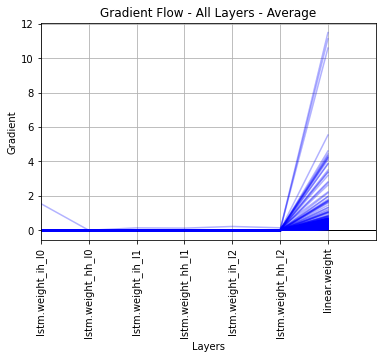

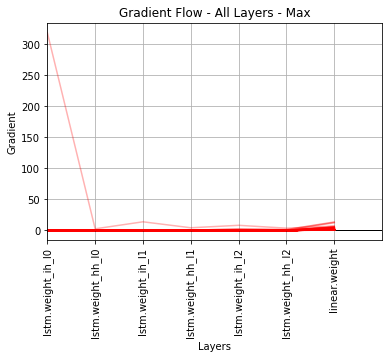

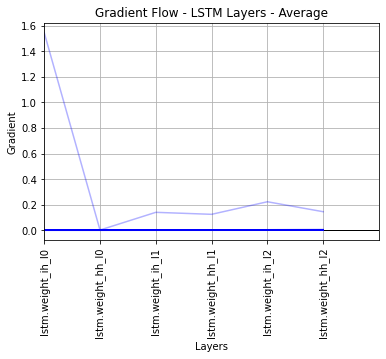

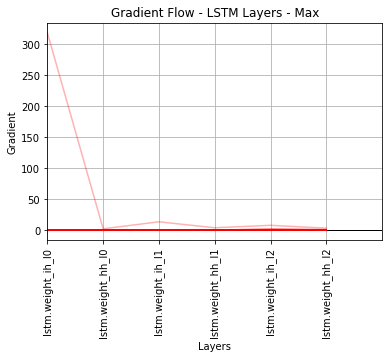

N: 654 	MDA:54.13 	MAPE:1.14 	MAE:1.17 	MSE:2.61
Num expected returns from training: 654
Initial Q:
 [1.44582819e-05 1.28522449e-03 2.51696439e-03 4.22260405e-03
 5.76507234e-03 7.82218298e-03 1.01230839e-02]

Computing initial allocation policy from the training set...
Expected Gains per Bin: [ 0.          4.72099304 11.08401489  7.41799927  7.74001312  7.06399536
 -5.19499969  5.16100311]
Trades per bin: [ 0. 14. 13.  8.  7.  9.  8.  5.]

Initial Allocation Policy: [0 1 1 1 1 1 0 1]

PERFORMING VALIDATION...
Buy and Hold Baseline:
Price at start: $137.36
Price at end: $112.52
Difference: $-24.84
Return:-18.08%

Profit from trading:-12.40
Return from trading:-9.03%
Length Returns: 1147
Q:
 [1.44582819e-05 2.02834734e-03 4.57916223e-03 6.81866138e-03
 1.04627632e-02 1.54055772e-02 2.21146239e-02]
E:
 [  0.           6.78299713  11.08401489 -17.43399811  11.67301178
  11.56499481  -5.19499969  17.07699966]
A:
 [0 1 1 0 1 1 0 1]
C:
 [0. 2. 0. 2. 2. 4. 0. 7.]
N: 493 	MDA:52.13 	MAPE:5.42 

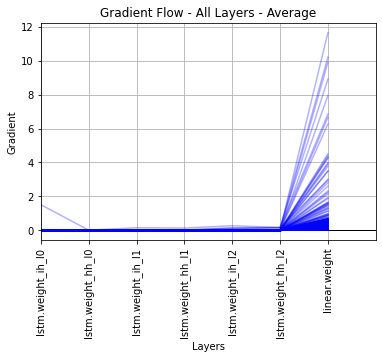

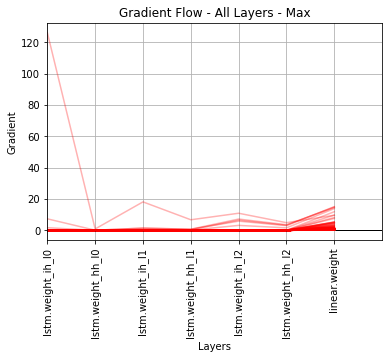

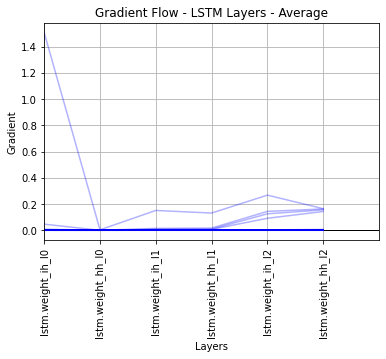

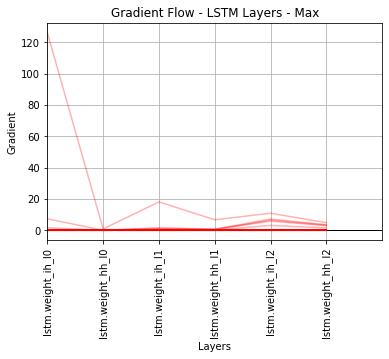

N: 654 	MDA:53.36 	MAPE:1.15 	MAE:1.17 	MSE:2.64
Num expected returns from training: 654
Initial Q:
 [8.19707115e-05 1.02753485e-03 2.79072820e-03 4.04947154e-03
 6.09088367e-03 7.54751173e-03 1.04135056e-02]

Computing initial allocation policy from the training set...
Expected Gains per Bin: [ 0.         10.31501007  6.3420105   9.47400665  2.25999451 -0.0289917
  2.17099762  3.97600555]
Trades per bin: [ 0. 18. 10. 12.  5.  6.  9.  4.]

Initial Allocation Policy: [0 1 1 1 1 0 1 1]

PERFORMING VALIDATION...
Buy and Hold Baseline:
Price at start: $137.36
Price at end: $112.52
Difference: $-24.84
Return:-18.08%

Profit from trading:3.61
Return from trading:2.63%
Length Returns: 1147
Q:
 [8.19707115e-05 2.18304230e-03 4.53257399e-03 7.12191152e-03
 1.06064021e-02 1.65000429e-02 2.31930081e-02]
E:
 [ 0.          9.90002441 12.32400513 21.37300873  2.25999451 -0.0289917
  9.87800598 -3.0249939 ]
A:
 [0 1 1 1 1 0 1 0]
C:
 [0. 3. 2. 3. 0. 0. 5. 4.]
N: 493 	MDA:53.14 	MAPE:5.32 	MAE:4.26 	MS

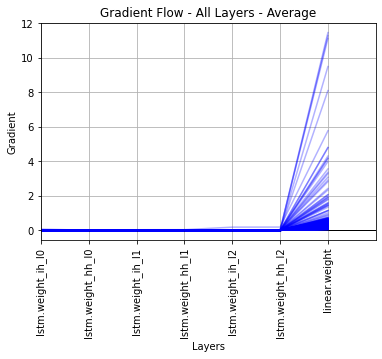

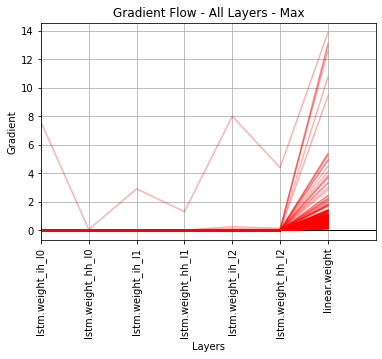

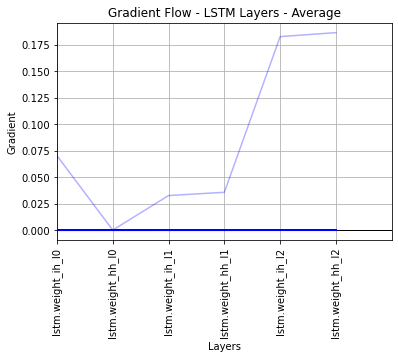

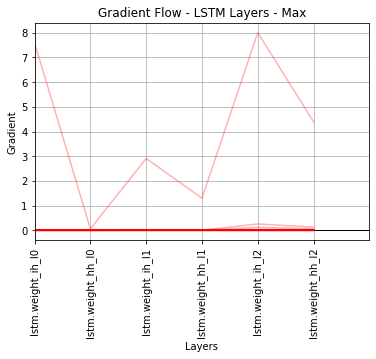

N: 654 	MDA:54.43 	MAPE:1.14 	MAE:1.16 	MSE:2.60
Num expected returns from training: 654
Initial Q:
 [5.82069250e-05 1.37477428e-03 2.60848845e-03 4.28708547e-03
 5.94447802e-03 7.73326859e-03 1.01884114e-02]

Computing initial allocation policy from the training set...
Expected Gains per Bin: [ 0.          6.47599792 14.51100159  8.06700134  2.36901093  9.5759964
 -7.07099915  5.93299866]
Trades per bin: [ 0. 12. 13.  9.  5. 11.  9.  5.]

Initial Allocation Policy: [0 1 1 1 1 1 0 1]

PERFORMING VALIDATION...
Buy and Hold Baseline:
Price at start: $137.36
Price at end: $112.52
Difference: $-24.84
Return:-18.08%

Profit from trading:-7.72
Return from trading:-5.62%
Length Returns: 1147
Q:
 [5.82069250e-05 1.87152309e-03 4.58126105e-03 7.66358342e-03
 1.10440840e-02 1.65718911e-02 2.49793041e-02]
E:
 [ 0.          9.66699982 -7.40499115  9.11000824  6.72400665 16.2539978
 -7.07099915 17.4859848 ]
A:
 [0 1 0 1 1 1 0 1]
C:
 [0. 3. 2. 1. 2. 4. 0. 8.]
N: 493 	MDA:51.52 	MAPE:5.80 	MAE:4.62 	

KeyboardInterrupt: 

In [302]:
test_results = []
val_results = []
for i in range(10):
    print("\nTrial:", i)
    print("********\n")
    model, journal, result = run_hypers(verbosity = 1, plot = 1)
    test_results.append(result['test_return_pct'])
    val_results.append(result['val_return_pct'])
    
print(np.mean(np.array(val_results)))
print(np.std(np.array(val_results)))

print(np.mean(np.array(test_results)))
print(np.std(np.array(test_results)))

In [ ]:
torch.set_printoptions(profile="short")

for name in model.named_parameters():
    print(name[0])
    print(name[1][:])

print(model.lstm.weight_ih_l0.size())
print(model.lstm.bias_ih_l0.size())
print(model.lstm.weight_hh_l0.size())
print(model.lstm.bias_hh_l0.size())


print(model.lstm.weight_hh_l1.size())
print(model.lstm.weight_ih_l1.size())

print(model.lstm.weight_hh_l2.size())
print(model.lstm.weight_ih_l2.size())

print(model.linear.weight.size())
print(model.linear.bias.size())





In [ ]:
# Use first asset in list of assets as the source
assets = ['SPY', 'DIA', 'ONEQ', 'IWM']

print(asset_list)
syn_df = asset_dict[asset_list[0]].copy()

display(syn_df.head(5))
print(syn_df.describe())    

asset_dict['SYN'] = syn_df 

trend_list = [(1, 20)]
make_synthetic_df(asset_dict['SYN'], trend_list, 0, 0, 1.4)

display(syn_df.head(5))
print(syn_df.describe())    


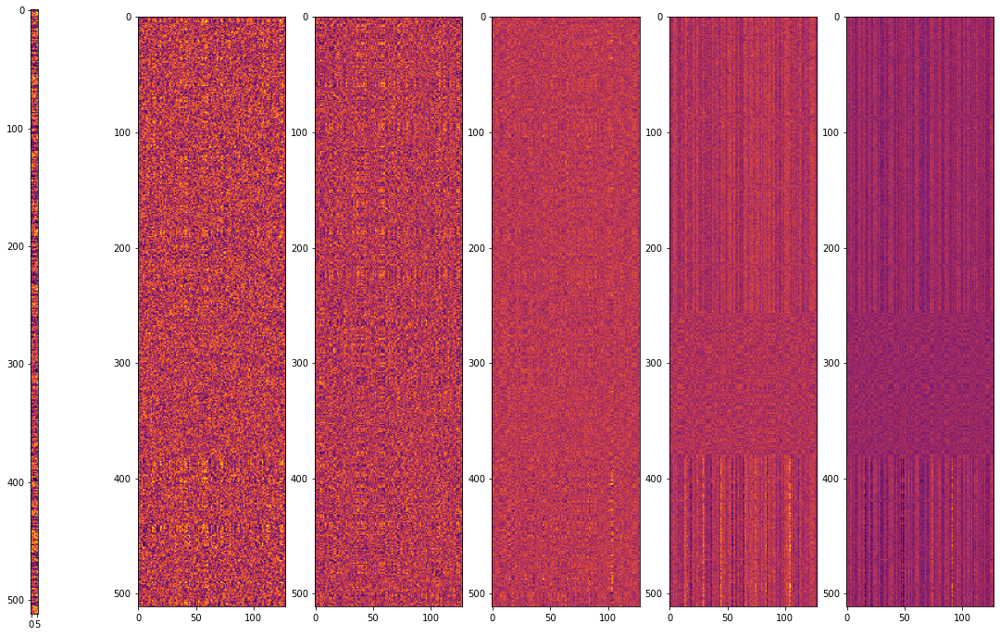

In [466]:
import matplotlib.pyplot as plt
import cv2

# norm_img=cv2.normalize(img, None, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F)

# plt.imshow(img, cmap='gray')
fig, ax = plt.subplots(1,6,figsize=(20,12))
ax[0].imshow(model.lstm.weight_ih_l0.cpu().detach().numpy(), cmap='inferno')
ax[1].imshow(model.lstm.weight_hh_l0.cpu().detach().numpy(), cmap='inferno')
ax[2].imshow(model.lstm.weight_ih_l1.cpu().detach().numpy(), cmap='inferno')
ax[3].imshow(model.lstm.weight_hh_l1.cpu().detach().numpy(), cmap='inferno')
ax[4].imshow(model.lstm.weight_ih_l2.cpu().detach().numpy(), cmap='inferno')
ax[5].imshow(model.lstm.weight_hh_l2.cpu().detach().numpy(), cmap='inferno')

# ih_l0 - has dimension 6 x 512

# fig.tight_layout()

In [ ]:
# Stock market indices
# assets = ['^GSPC', '^DJI', '^IXIC', '^RUT']

assets = ['SPY', 'DIA', 'ONEQ', 'IWM']

asset_list = assets

In [ ]:
# Iterate through index list, check if we already have the data (load it) or go get it from Yahoo! (save it)
# Make a dictionary of dataframes containing all the data

start_date = '01-01-2005'
# stop_date = '05-01-2018' # First version of paper
stop_date = '12-20-2019' # Final version of paper
directory = '../../../data/yahoo_data'

# If the 'directory' doesn't exist, create it
#if os.path.isdir(directory) == False:
#    os.mkdir(directory)

asset_dict = {}
for asset in asset_list:
    df = get_data(asset_name=asset, directory=directory, start_date=start_date, stop_date=stop_date)    
    asset_dict[asset] = df 

In [ ]:
for asset in asset_list:
    display(asset_dict[asset].head(5))
    print(asset, asset_dict[asset].describe())

In [ ]:
# Plot all the assets in Plotly interactive charts with a Candlestick chart
for asset in asset_list:
    plotly_candlestick(asset_dict, asset)

In [ ]:
# Before we split the data into train, validation and test sets let's add the Prev Adj Close feature and
# remove the Date and Volume columns (which are not used)

for asset in asset_list:
    asset_dict[asset] = add_features_to_df(asset_dict[asset])       
    display(asset, asset_dict[asset].head(5))

In [ ]:
# Define the start and end dates for each of the sets - start and end dates are inclusive

# Training set
train_start = '01-01-2005'
train_end = '01-01-2008'

# Validation set
valid_start = '01-02-2008'
valid_end = '12-31-2009'

# A combined train / valid set
train_val_start = '01-01-2005'
train_val_end = '12-31-2009'

# Pre-test set (120 days prior to test period, to generate allocation policy for testing)
pre_test_start = '07-15-2009'
pre_test_end = '12-31-2009'

# Out of sample test set
test_start = '01-01-2010'
test_end = '12-20-2019'


In [21]:
# paper_baseline = {'SPY':136.4, 'DIA':136.6, 'ONEQ':228.9, 'IWM':163.5} # Original paper
paper_baseline = {'SPY':188.87, 'DIA':172.87, 'ONEQ':293.32, 'IWM':167.34, 'SYN':0} # Latest paper - table 12


train_asset_dict = {}
valid_asset_dict = {}
test_asset_dict = {}
train_val_asset_dict = {}
pre_test_asset_dict = {}

for asset in asset_list:
    # Make a dataframe for this asset
    df = asset_dict[asset]
    
    # Mask off the training data and assign result to a train_asset dictionary
    mask = (df['Date'] >= train_start) & (df['Date'] <= train_end)
    train_asset_dict[asset] = df.loc[mask]
    
    # Mask off the validation data and assign result to a valid_asset dictionary
    mask = (df['Date'] >= valid_start) & (df['Date'] <= valid_end)
    valid_asset_dict[asset] = df.loc[mask]
    
    # Mask off the test data and assign result to a test_asset dictionary
    mask = (df['Date'] >= test_start) & (df['Date'] <= test_end)
    test_asset_dict[asset] = df.loc[mask]
    
    # Mask off the combined train / validation data and assign result to a train_val_asset dictionary
    mask = (df['Date'] >= train_val_start) & (df['Date'] <= train_val_end)
    train_val_asset_dict[asset] = df.loc[mask]

    # Mask off the pre_test data and assign result to a pre_test_asset dictionary
    mask = (df['Date'] >= pre_test_start) & (df['Date'] <= pre_test_end)
    pre_test_asset_dict[asset] = df.loc[mask]
    
    # Reset the indices to start from 0 again for each of the dataframes
    train_asset_dict[asset].index = np.arange(train_asset_dict[asset].shape[0])    
    valid_asset_dict[asset].index = np.arange(valid_asset_dict[asset].shape[0])    
    test_asset_dict[asset].index = np.arange(test_asset_dict[asset].shape[0])
    train_val_asset_dict[asset].index = np.arange(train_val_asset_dict[asset].shape[0])    
    pre_test_asset_dict[asset].index = np.arange(pre_test_asset_dict[asset].shape[0])    

    
#    display(test_asset_dict[asset])

print("Adjusted Close to Adjusted Close:")
print('Asset\tStart Date\t\tBeg$\tEnd Date\t\tEnd$\tGain%\tPaper%')
for asset in asset_list:
    # Print the buy and hold returns over the entire test period (the papers baseline)
    start = test_asset_dict[asset]['Adj Close'].loc[0]
    end = test_asset_dict[asset]['Adj Close'].loc[test_asset_dict[asset].shape[0]-1]
    gain = 100.0 * (end - start) / start
    
    print(asset, '\t', test_asset_dict[asset]['Date'].loc[0], '\t{:1.2f}'.format(start), '\t', 
          test_asset_dict[asset]['Date'].loc[test_asset_dict[asset].shape[0]-1], 
          '\t{:1.2f}'.format(end), '\t{:1.2f}'.format(gain), '\t{:1.2f}'.format(paper_baseline[asset]))

print("\nClose to Close:")
print('Asset\tStart Date\t\tBeg$\tEnd Date\t\tEnd$\tGain%\tPaper%')
for asset in asset_list:
    # Print the buy and hold returns over the entire test period (the papers baseline)
    start = test_asset_dict[asset]['Close'].loc[0]
    end = test_asset_dict[asset]['Close'].loc[test_asset_dict[asset].shape[0]-1]
    gain = 100.0 * (end - start) / start
    
    print(asset, '\t', test_asset_dict[asset]['Date'].loc[0], '\t{:1.2f}'.format(start), '\t', 
          test_asset_dict[asset]['Date'].loc[test_asset_dict[asset].shape[0]-1], 
          '\t{:1.2f}'.format(end), '\t{:1.2f}'.format(gain), '\t{:1.2f}'.format(paper_baseline[asset]))
    
print("\nOpen to Close:")
print('Asset\tStart Date\t\tBeg$\tEnd Date\t\tEnd$\tGain%\tPaper%')
for asset in asset_list:
    # Print the buy and hold returns over the entire test period (the papers baseline)
    start = test_asset_dict[asset]['Open'].loc[0]
    end = test_asset_dict[asset]['Close'].loc[test_asset_dict[asset].shape[0]-1]
    gain = 100.0 * (end - start) / start
    
    print(asset, '\t', test_asset_dict[asset]['Date'].loc[0], '\t{:1.2f}'.format(start), '\t', 
          test_asset_dict[asset]['Date'].loc[test_asset_dict[asset].shape[0]-1], 
          '\t{:1.2f}'.format(end), '\t{:1.2f}'.format(gain), '\t{:1.2f}'.format(paper_baseline[asset]))    
    
# It looks like the paper used Close-Close or Open-Close rather than Adjusted Close to compute gains over the test period. 
# They are a lot closer to the paper quoted returns and better correlated
    

In [ ]:
print("Train set length:", len(train_asset_dict['SPY']))
print("Valid set length", len(valid_asset_dict['SPY']))
print("Train / Valid set length", len(train_val_asset_dict['SPY']))
print("Pre-test set", len(pre_test_asset_dict['SPY']))
print("Test set",len(test_asset_dict['SPY']))